In [41]:
import pandas as pd
import numpy as np

#ML metrics and preprocessing  
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split 

# ML Models
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, IsolationForest

# TDA 
import gtda.time_series as ts
from gtda.homology import EuclideanCechPersistence
from gtda.homology import VietorisRipsPersistence
from gtda.diagrams import PairwiseDistance
from gtda.diagrams import PersistenceEntropy

#data visualization 
import plotly.graph_objects as go
import plotly.express as px
from matplotlib import pyplot
from pandas.plotting import lag_plot
from pandas.plotting import autocorrelation_plot
import matplotlib.pyplot as plt
import seaborn as sns

#statistical analysis
from statsmodels.tsa.stattools import adfuller
from scipy.stats import kurtosis, skew

# Financial data 
from talib import RSI
import ta

In [2]:
#reading data
df = pd.read_csv('data.csv')
df.head(5)

,Unnamed: 0,Date,Open,High,Low,Close,Adj Close,Volume,name
0,0,2015-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NFLX
1,1,2015-01-05,49.258572,49.258572,47.147144,47.311428,47.311428,18165000.0,NFLX
2,2,2015-01-06,47.347141,47.639999,45.661430,46.501431,46.501431,16037700.0,NFLX
3,3,2015-01-07,47.347141,47.421429,46.271427,46.742859,46.742859,9849700.0,NFLX
4,4,2015-01-08,47.119999,47.835712,46.478573,47.779999,47.779999,9601900.0,NFLX


In [3]:
df.groupby('name').get_group('NFLX')

,Unnamed: 0,Date,Open,High,Low,Close,Adj Close,Volume,name
0,0,2015-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NFLX
1,1,2015-01-05,49.258572,49.258572,47.147144,47.311428,47.311428,18165000.0,NFLX
2,2,2015-01-06,47.347141,47.639999,45.661430,46.501431,46.501431,16037700.0,NFLX
3,3,2015-01-07,47.347141,47.421429,46.271427,46.742859,46.742859,9849700.0,NFLX
4,4,2015-01-08,47.119999,47.835712,46.478573,47.779999,47.779999,9601900.0,NFLX
...,...,...,...,...,...,...,...,...,...
2280,2280,2024-01-25,551.950012,563.460022,548.460022,562.000000,562.000000,9451900.0,NFLX
2281,2281,2024-01-26,561.809998,579.640015,558.429993,570.419983,570.419983,12770600.0,NFLX
2282,2282,2024-01-29,571.349976,578.549988,562.679993,575.789978,575.789978,6905400.0,NFLX
2283,2283,2024-01-30,567.320007,570.880005,560.820007,562.849976,562.849976,6181800.0,NFLX


In [4]:
df['Date'] = pd.DatetimeIndex(df['Date'])
#remove unimportant column
df.drop('Unnamed: 0',inplace=True,axis=1)

df.sort_values(by=['name','Date'],inplace=True)
df.set_index('Date',inplace=True)

df.head(5)

,Open,High,Low,Close,Adj Close,Volume,name
Date,,,,,,,
2015-01-02,54.279999,54.599998,53.070000,53.910000,51.079914,10748600.0,AAL
2015-01-05,54.369999,54.540001,53.340000,53.880001,51.051479,11565000.0,AAL
2015-01-06,54.270000,54.430000,52.130001,53.040001,50.255577,13772200.0,AAL
2015-01-07,53.380001,53.650002,52.119999,53.009998,50.227158,10069800.0,AAL
2015-01-08,53.480000,54.279999,53.250000,53.660000,50.843040,9672100.0,AAL


In [5]:
name_stocks = list(df['name'].unique())
print('Our data includes following stocks \n')
print(name_stocks)

Our data includes following stocks 

['AAL', 'AUDUSD=X', 'BABA', 'BIDU', 'BTC-USD', 'CNY=X', 'DIS', 'DOGE-USD', 'ETH-USD', 'F', 'GBPUSD', 'GBPUSD=X', 'GM', 'GOOGL', 'JNJ', 'META', 'MRK', 'NFLX', 'NIO', 'NVDA', 'PFE', 'TM', 'TSLA', 'UAH=X']


## Missing Value Analysis

Here, we examine missing values

- **Percentage of Missing Values**: We calculate the percentage of missing values for each stock. 

- **Date Interval Analysis**: For each stock, we identify the date range of the available data. For instance we understood that `JNJ` just contain a very short data so seems impossible to use it. 

- **Gaps Between Missing Values**: We examine the gaps between consecutive missing values (measured in days) across the dataset. Values here suggest suitability of interpolation for handling missing values.


In [6]:
missing_gaps = {}
for stock in name_stocks:
    #start and end date 
    end_date = max(df[df["name"] == stock].index)
    start_date = min(df[df["name"] == stock].index)
    
    #percentage of nan vals
    nan_percentage = df[df["name"] == stock]['Adj Close'].isnull().mean() * 100
    
    #gaps between missing values
    missing_indices = np.where(df[df["name"] == stock]['Adj Close'].isnull())[0]
    gaps = np.diff(missing_indices)
    
    #saving gaps
    missing_gaps[stock] = gaps
    print('Stock: ',stock)
    print('Range of dates: From ',start_date, " To ", end_date)
    print('Percentage of NaN values = ',nan_percentage)
    print('Average of gaps between missing values = ',np.mean(gaps))
    print('Std of gaps between missing values = ',np.std(gaps))
    print('\n')



Stock:  AAL
Range of dates: From  2015-01-02 00:00:00  To  2024-01-31 00:00:00
Percentage of NaN values =  4.50765864332604
Average of gaps between missing values =  21.941176470588236
Std of gaps between missing values =  19.44667093310891


Stock:  AUDUSD=X
Range of dates: From  2015-01-01 00:00:00  To  2024-02-01 00:00:00
Percentage of NaN values =  1.3496415014761705
Average of gaps between missing values =  74.93548387096774
Std of gaps between missing values =  74.08013772537839


Stock:  BABA
Range of dates: From  2015-01-02 00:00:00  To  2024-01-31 00:00:00
Percentage of NaN values =  1.663019693654267
Average of gaps between missing values =  60.54054054054054
Std of gaps between missing values =  56.59175500762413


Stock:  BIDU
Range of dates: From  2015-01-02 00:00:00  To  2024-01-31 00:00:00
Percentage of NaN values =  6.433260393873086
Average of gaps between missing values =  15.417808219178083
Std of gaps between missing values =  16.980955024740545


Stock:  BTC-USD
Ra

## Daily Analysis

In this section, we will perform an Exploratory Data Analysis (EDA) on daily returns to better understand the behavior of the stocks. Our analysis includes:

- **Trends Analysis**: Examining the time series of daily closing prices to identify any noticeable trends.
- **Distribution Visualization**: Creating histograms and box plots for the daily returns of each stock to visualize the distribution and detect any outliers.
- **Statistical Measures**: Exploring the distributions of daily returns by calculating statistical measures such as standard deviation, kurtosis, and skewness. This helps us better understand the risk and volatility associated with each stock.
- **Correlation Analysis**: Analyzing the correlations between pairs of stocks to identify any potential relationships or dependencies.



### Trends Analysis

In [7]:
#trends of daily close price 
fig = go.Figure()
for name in name_stocks:
    fig.add_trace(go.Scatter(x = df[df['name'] == name].index, y = df[df['name'] == name]['Adj Close'].values,mode='lines',name =name))
fig.show()

In [33]:
#trends of daily close price 
fig = go.Figure()
for stock in name_stocks:
    fig.add_trace(go.Scatter(x = df[df['name'] == name].index, y = df[df['name'] == stock]['Adj Close'] -  df[df['name'] == stock]['Adj Close'].shift(1),mode='lines',name =stock))
fig.show()

From the trend analysis, several key observations:

1. **Bitcoin's Volatility and Peak Values**: Bitcoin (BTC_USD) stands out with the highest values observed in the plot. It exhibits significant upward and downward trends, with one of the most notable peaks occurring in March 2021. This peak is attributed to the market's response to the COVID-19 pandemic.

2. **Ethereum's Fluctuations**: Excluding Bitcoin, Ethereum (ETH) displays the next highest level of fluctuation among the analyzed assets. As another major cryptocurrency, ETH's high variance shows the inherent volatility associated with digital currencies.

3. **Non-Crypto Stocks**: The other stocks analyzed exhibit more stable trends comparing to BTC and ETH. 

4. **Notable Trends in Tech Stocks**: Focusing on technology stocks, both Google (GOOGL) and Meta (META) experienced upward trends starting from November 2022. This surge can be partially attributed to the release and rising popularity of ChatGPT, underscoring the influence of technological advancements and innovations on stock performances.

### Distribution Visualization: 

In [8]:
return_close = {}

for stock in name_stocks:
    #daily return
    return_list = df[df['name'] == stock]['Adj Close'] -  df[df['name'] == stock]['Adj Close'].shift(1)
    return_close[stock] = return_list.values

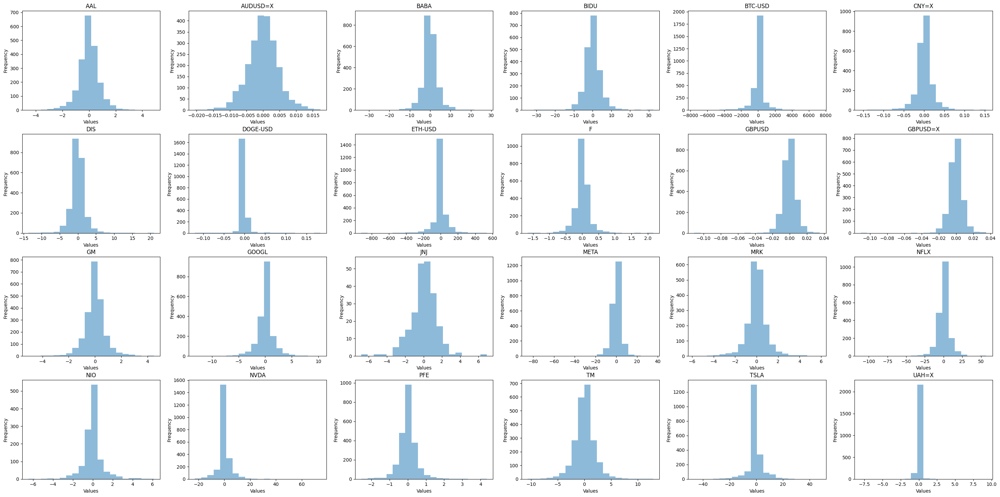

In [23]:
#plotting
fig, axs = plt.subplots(4, 6, figsize=(30, 15))  
fig.tight_layout(pad=3.0)

axs = axs.flatten()

# iterate over items in dictionary 
for i, (key, values) in enumerate(return_close.items()):
    axs[i].hist(values, bins=20, alpha=0.5)
    axs[i].set_title(key)
    axs[i].set_xlabel('Values')
    axs[i].set_ylabel('Frequency')

plt.show()

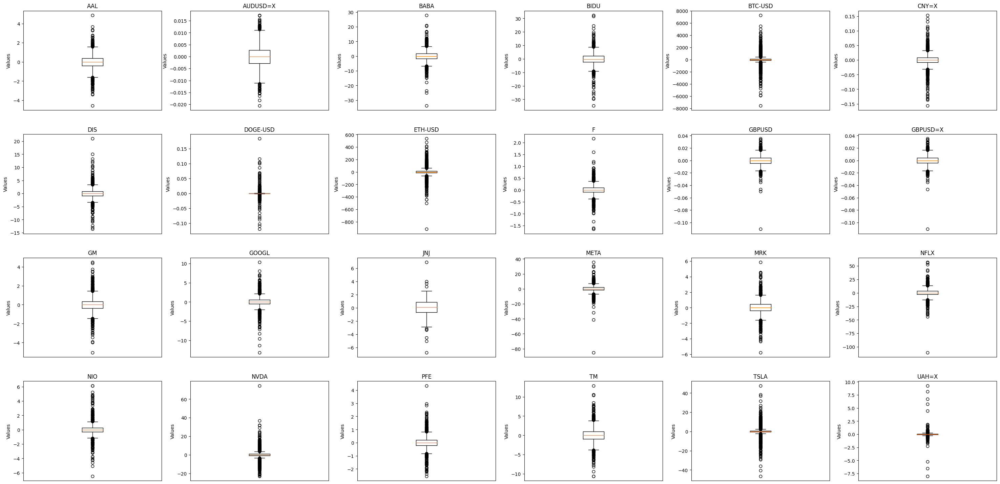

In [31]:
fig, axs = plt.subplots(4, 6, figsize=(30,15))  # Adjust figsize as needed
fig.tight_layout(pad=3.0)

axs = axs.flatten()

# iterate over items in dictionary 
for i, (key, values) in enumerate(return_close.items()):
    #remove nan values 
    filtered_values = [value for value in values if not (value != value)]
    
    axs[i].boxplot(filtered_values)
    axs[i].set_title(key)
    axs[i].set_xticks([])
    axs[i].set_ylabel('Values')


plt.show()

### Outlier Analysis Using Boxplots

Boxplots shows a significant number of outliers across almost all stocks in our dataset. So we will apply the same methodology (as box plot) for outlier detection.

In [37]:
def calculate_outliers_ratio(data):
    """
    Measuring the ratio of outliers in the data using the IQR (same method as boxplot outliers)
    """
    # removing nan vals
    clean_data = [x for x in data if x == x]
    
    # Q1, Q3 , IQR
    Q1, Q3 = np.percentile(clean_data, [25, 75])
    IQR = Q3 - Q1
    
    # identify outliers
    outliers = [x for x in clean_data if x < Q1 - 1.5 * IQR or x > Q3 + 1.5 * IQR]
    
    if clean_data:
        ratio = len(outliers) / len(clean_data)
    else:
        ratio = 0  
    
    return ratio

In [39]:
outliers_ratios = {key: calculate_outliers_ratio(values) for key, values in return_close.items()}

for stock, ratio in outliers_ratios.items():
    print(f'{stock}: {ratio:.2%} outliers')

AAL: 5.57% outliers
AUDUSD=X: 2.43% outliers
BABA: 6.61% outliers
BIDU: 4.95% outliers
BTC-USD: 23.66% outliers
CNY=X: 9.64% outliers
DIS: 7.64% outliers
DOGE-USD: 34.45% outliers
ETH-USD: 20.77% outliers
F: 7.59% outliers
GBPUSD: 3.78% outliers
GBPUSD=X: 3.94% outliers
GM: 7.34% outliers
GOOGL: 13.42% outliers
JNJ: 4.35% outliers
META: 9.60% outliers
MRK: 7.41% outliers
NFLX: 9.73% outliers
NIO: 16.97% outliers
NVDA: 22.12% outliers
PFE: 8.39% outliers
TM: 5.73% outliers
TSLA: 29.67% outliers
UAH=X: 10.02% outliers


`AUDUSD=X` and `GBPUSD=X` have the lowest percentage of outliers, suggesting them as perfect candidates for trading.

### Statistical Measures of Risk
It's apparent that high value of std or kurtosis of daily return shows a higher risk for trading on that stock. So here we analyze these two statistics.
The stocks `AUDUSD=X` and `GBPUSD=X`, previously identified through outlier analysis, also exhibit relatively low standard deviation and kurtosis, further confirmation their suitability for trading.

In [57]:
std_devs = []
kurts = []
skewnesses = []

for stock, return_list in return_close.items():
    filtered_values = [value for value in return_list if not (value != value)]
    std_dev = np.nanstd(filtered_values, ddof=1)  # Sample standard deviation
    kurt = kurtosis(filtered_values, fisher=True)  # Fisher's definition (subtracting 3)
    skewness = skew(filtered_values)
    
    std_devs.append(std_dev)
    kurts.append(kurt)
    skewnesses.append(skewness)
  

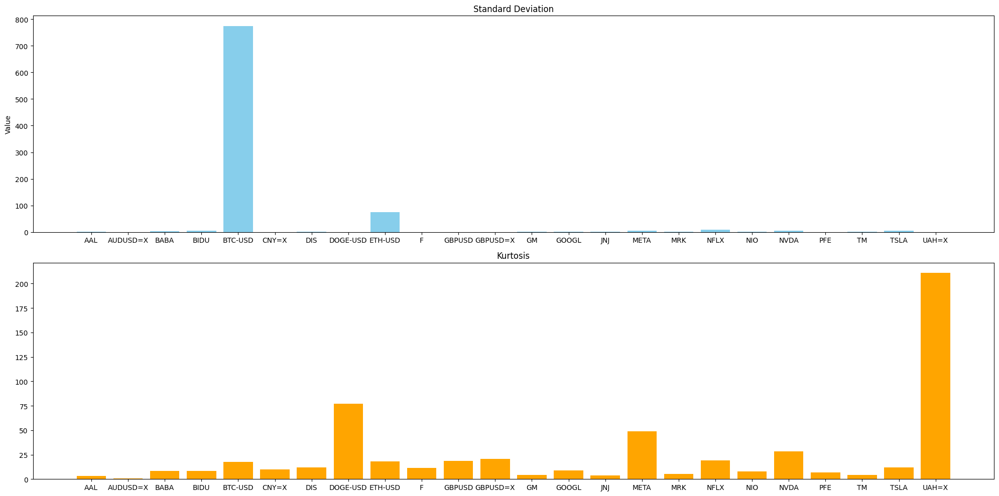

In [58]:
#plotting
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

# std
axs[0].bar(return_close.keys(), std_devs, color='skyblue')
axs[0].set_title('Standard Deviation')
axs[0].set_ylabel('Value')

# kurts
axs[1].bar(return_close.keys(), kurts, color='orange')
axs[1].set_title('Kurtosis')


plt.tight_layout()
plt.show()

### Correlation Analysis

A heatmap of daily return correlations between stock pairs shows two pairs with high correlation (>0.7):

1. `F` (Ford) and `GM` (General Motors): These companies are related due to their involvement in the automotive industry, sharing similar market influences, economic sensitivities.

2. `GBPUSD` and `GBPUSD=X`: These two seems almost identical.


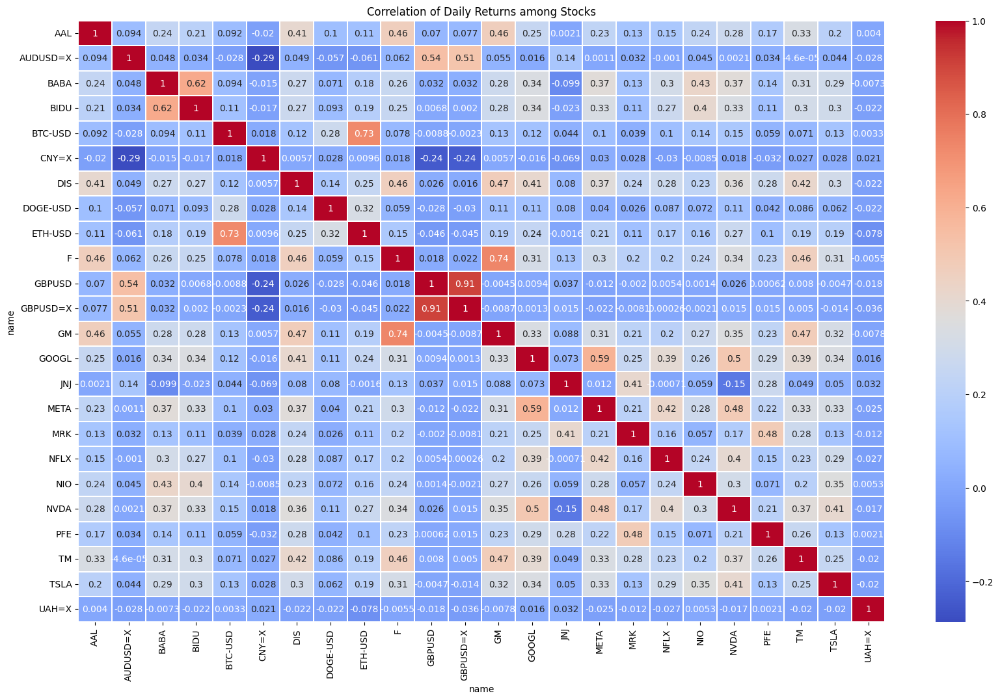

In [71]:
df['return_of_close'] = df.groupby('name')['Adj Close'].pct_change()

# pivot the DataFrame to have dates as rows and stock names as columns
pivot_df = df.pivot_table(values='return_of_close', index=df.index, columns='name')

#corr matrix
corr_matrix = pivot_df.corr()

#plotting
plt.figure(figsize=(20, 12))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=.2)
plt.title('Correlation of Daily Returns among Stocks')
plt.show()

All in all, it seems that considering `AUDUSD=X` and `GBPUSD=X` as our cnadidates to trade could be a resaonable choice. 